In [ ]:
!rm -rf /content/malware_dataset.zip /content/sample_data
!pip install --upgrade --no-cache-dir gdown

#https://drive.google.com/file/d/1N2dyWa1uxwCBXtNLqisbUkm5SKlZLKBp/view?usp=drive_link
!gdown https://drive.google.com/uc?id=1N2dyWa1uxwCBXtNLqisbUkm5SKlZLKBp
!unzip /content/malware_dataset.zip
!rm -rf /content/malware_dataset.zip

# !gdown https://drive.google.com/uc?id=1z_BVURk7ShW9G7DTzUMhy1x3vSzPkkxp
# !mkdir sample
# !mv /content/predict_score.py /content/sample/.

Streaming output truncated to the last 5000 lines.
  inflating: malimg_paper_dataset_imgs/Allaple.L/06524ebf396548004410f99a4dde2e54.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/06524f125eece7a54370609287188980.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/0652f1f4bad2c5c928080bc90db86ed1.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/0654748b4cc3330deef95ab0af4041cf.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/06549b73968ac1fc1e8eb54dddb10833.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/065513aa17b61f57cf793703a725c015.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/06583d83c5278fac7cd20c015780c1d0.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/0658876855197e86e417ba8a84d298ec.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/06598930132128de200841974164a858.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/065a7e3f38d8cc3ca056b4f5fc272643.png  
  inflating: malimg_paper_dataset_imgs/Allaple.L/065d1f12c517c06d5a51

In [ ]:
import os
os.listdir('/content/malimg_paper_dataset_imgs')

['Yuner.A',
 'C2LOP.gen!g',
 'Agent.FYI',
 'Dontovo.A',
 'VB.AT',
 'Autorun.K',
 'Adialer.C',
 'Alueron.gen!J',
 'Wintrim.BX',
 'Swizzor.gen!I',
 'Lolyda.AA2',
 'Swizzor.gen!E',
 'malimg_dataset_readme.txt',
 'Lolyda.AA3',
 'Dialplatform.B',
 'Lolyda.AT',
 'C2LOP.P',
 'Allaple.L',
 'Instantaccess',
 'Allaple.A',
 'Obfuscator.AD',
 'Fakerean',
 'Skintrim.N',
 'Rbot!gen',
 'Lolyda.AA1',
 'Malex.gen!J']

In [ ]:
!mv /content/malimg_paper_dataset_imgs /content/data2
!rm -rf /content/data2/malimg_dataset_readme.txt

In [ ]:
import os
import random
import shutil

# Define the path to your images folder
images_folder = "/content/data2"

# Define the classes
classes = os.listdir(images_folder)

os.makedirs('/content/data',exist_ok=True)
# Create train and validation folders
train_folder = os.path.join('/content/data', 'train')
val_folder = os.path.join('/content/data', 'test')

os.makedirs(train_folder, exist_ok=True)
os.makedirs(val_folder, exist_ok=True)

# Define the split ratio
split_ratio = 0.8

# Iterate through each class
for class_name in classes:
    class_folder = os.path.join(images_folder, class_name)
    images = os.listdir(class_folder)
    random.shuffle(images)  # Shuffle the images

    # Calculate the split index
    split_index = int(len(images) * split_ratio)

    # Split the images
    train_images = images[:split_index]
    val_images = images[split_index:]

    # Copy training images to train folder
    for image in train_images:
        src = os.path.join(class_folder, image)
        dst = os.path.join(train_folder, class_name, image)
        os.makedirs(os.path.join(train_folder, class_name), exist_ok=True)
        shutil.copy(src, dst)

    # Copy validation images to validation folder
    for image in val_images:
        src = os.path.join(class_folder, image)
        dst = os.path.join(val_folder, class_name, image)
        os.makedirs(os.path.join(val_folder, class_name), exist_ok=True)
        shutil.copy(src, dst)

print("Data split and folders created successfully.")

Data split and folders created successfully.


In [ ]:
!rm -rf /content/data2

In [ ]:
import os
from PIL import Image

def rename_images(directory):
    class_folders = os.listdir(directory)

    for class_folder in class_folders:
        class_path = os.path.join(directory, class_folder)
        if os.path.isdir(class_path):
            image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('png', 'jpeg', 'jpg'))]

            for i, image_file in enumerate(image_files, 1):
                try:
                    with Image.open(os.path.join(class_path, image_file)) as img:
                        new_name = str(i) + '.jpg'
                        new_path = os.path.join(class_path, new_name)
                        os.rename(os.path.join(class_path, image_file), new_path)
                except (OSError, IOError):
                    print(f"Removing corrupted file: {os.path.join(class_path, image_file)}")
                    os.remove(os.path.join(class_path, image_file))

# Replace 'path_to_data_folder' with the actual path to your data folder
data_folder = '/content/data'

train_folder = os.path.join(data_folder, 'train')
test_folder = os.path.join(data_folder, 'test')

rename_images(train_folder)
rename_images(test_folder)

In [ ]:
import os
train_path = '/content/data/train'
test_path = '/content/data/test'
n_classes = 0
n_len_training = 0
d = {}
print('Training Files Details :\n')
for i in sorted(os.listdir(train_path)):
    print(f"Class Name = {i}")
    n_classes+=1
    l = len(os.listdir(os.path.join(train_path,i)))
    d[i] = [l]
    n_len_training+=l
    print(f"No of Images = {l}")
    print('='*50)

print(f'\nTotal No of Training Images = {n_len_training}')
print('='*50)
n_len_testing = 0
print('\n\nTest Files Details :\n')
for i in sorted(os.listdir(test_path)):
    print(f"Class Name = {i}")
    l = len(os.listdir(os.path.join(test_path,i)))
    d[i].append(l)
    n_len_testing+=l
    print(f"No of Images = {l}")
    print('='*50)
print(f'\nTotal No of Testing Images = {n_len_testing}')
print('='*50)
print(f'\n\nNo of classes = {n_classes}')

Training Files Details :

Class Name = Adialer.C
No of Images = 97
Class Name = Agent.FYI
No of Images = 92
Class Name = Allaple.A
No of Images = 2359
Class Name = Allaple.L
No of Images = 1272
Class Name = Alueron.gen!J
No of Images = 158
Class Name = Autorun.K
No of Images = 84
Class Name = C2LOP.P
No of Images = 116
Class Name = C2LOP.gen!g
No of Images = 160
Class Name = Dialplatform.B
No of Images = 141
Class Name = Dontovo.A
No of Images = 129
Class Name = Fakerean
No of Images = 304
Class Name = Instantaccess
No of Images = 344
Class Name = Lolyda.AA1
No of Images = 170
Class Name = Lolyda.AA2
No of Images = 147
Class Name = Lolyda.AA3
No of Images = 98
Class Name = Lolyda.AT
No of Images = 127
Class Name = Malex.gen!J
No of Images = 108
Class Name = Obfuscator.AD
No of Images = 113
Class Name = Rbot!gen
No of Images = 126
Class Name = Skintrim.N
No of Images = 64
Class Name = Swizzor.gen!E
No of Images = 102
Class Name = Swizzor.gen!I
No of Images = 105
Class Name = VB.AT
No of

Training Data Distribution


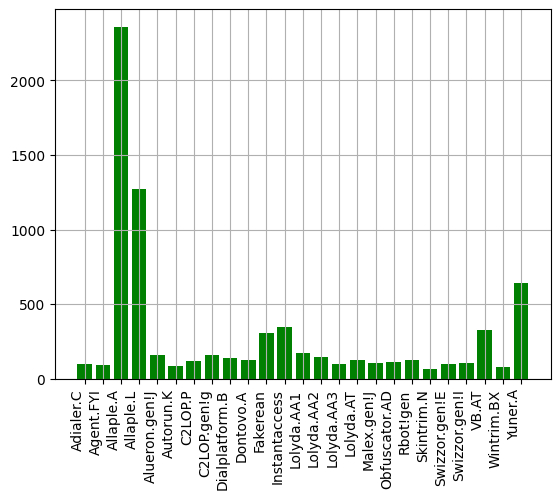

Testing Data Distribution


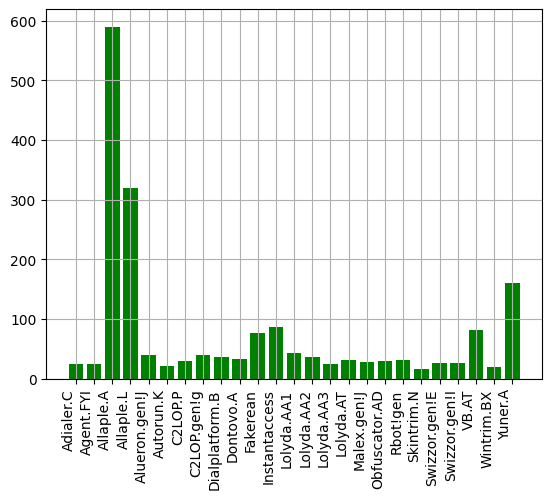

In [ ]:
import matplotlib.pyplot as plt
cls = []
val1 = []
val2 = []
for i,j in d.items():
    cls.append(i)
    val1.append(j[0])
    val2.append(j[1])
data = [(cls,val1)]
data.append((cls,val2))

print(f"Training Data Distribution")
plt.bar(x = data[0][0],height= data[0][1],color='green')
plt.xticks(rotation=90, ha='right')
plt.grid()
plt.show()
print('='*70)
print(f"Testing Data Distribution")
plt.bar(x = data[1][0],height= data[1][1],color='green')
plt.xticks(rotation=90, ha='right')
plt.grid()
plt.show()

In [ ]:
import numpy as np
d = {}
n_images = 5

for i in os.listdir(train_path):
    l = os.listdir(os.path.join(train_path,i))
    if len(l)>n_images:
        l = np.random.choice(l, n_images, replace=False).tolist()
    d[i] = list(map(lambda x:os.path.join(train_path,i,x),l))


Sample images of class :  Yuner.A


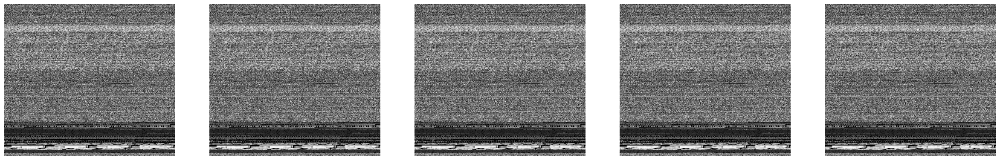


Sample images of class :  C2LOP.gen!g


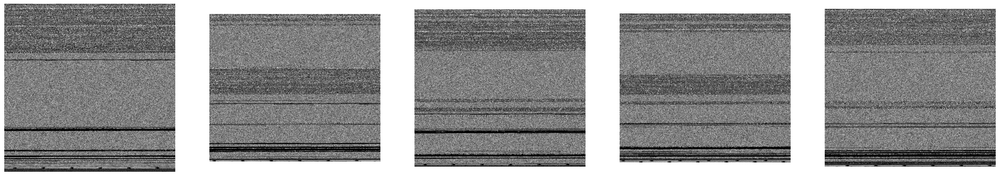


Sample images of class :  Agent.FYI


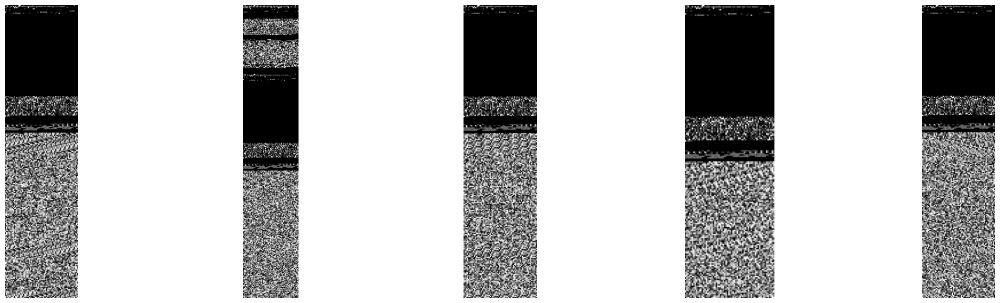


Sample images of class :  Dontovo.A


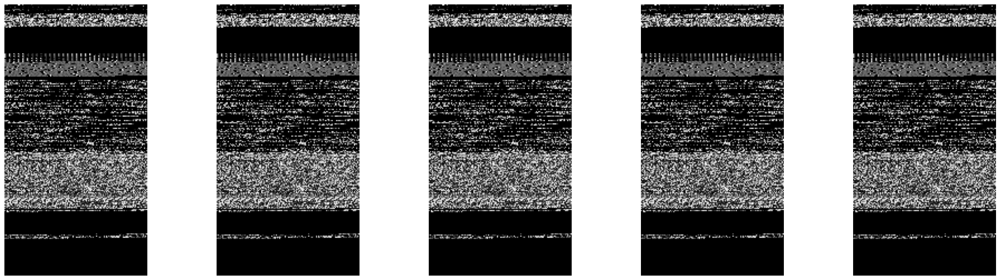


Sample images of class :  VB.AT


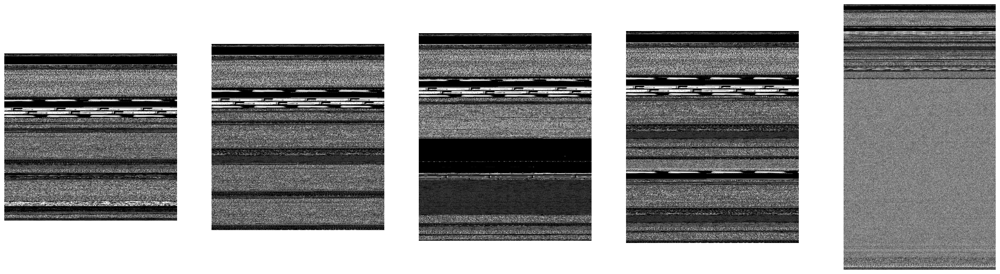

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
for i in list(d.keys()):
    print('\nSample images of class : ',i)
    images = d[i]
    plt.figure(figsize=(30,8))
    for j in range(len(images)):
        img = mpimg.imread(images[j])
        plt.subplot(1, n_images, j+1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
        plt.axis("off")
    plt.show()

**CNN ResNet50V2**

In [ ]:
!pip install scikit-plot

In [ ]:
import time
import tensorflow as tf
tf.config.run_functions_eagerly(True)

import scikitplot as skplt
from sklearn.metrics import classification_report,balanced_accuracy_score
import warnings
warnings.filterwarnings('ignore')
print(tf.__version__)

2.14.0


In [ ]:
pre_trained_model = tf.keras.applications.ResNet50V2(input_shape = (224, 224, 3),
                                include_top = False,
                                weights = 'imagenet')

for layer in pre_trained_model.layers:
    layer.trainable = True

94668760/94668760 [==============================] - 5s 0us/step


In [ ]:
pre_trained_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                                                                                         

In [ ]:
last_output = pre_trained_model.output

In [ ]:
# x = tf.keras.layers.GlobalMaxPooling2D(name='G_maxpool2d') (last_output)
x = tf.keras.layers.Flatten(name='flatten') (last_output)
x = tf.keras.layers.Dense(512, activation=tf.nn.relu, name='dense_1') (x)
x = tf.keras.layers.Dropout(0.5, name='dropout_dense_1') (x)

x = tf.keras.layers.Dense(256, activation=tf.nn.relu, name='dense_2') (x)
x = tf.keras.layers.Dropout(0.5, name='dropout_dense_2') (x)

# x = tf.keras.layers.Dense(1, activation = tf.nn.sigmoid, name='output_layer') (x)
x = tf.keras.layers.Dense(len(os.listdir('/content/data/train')), activation = tf.nn.softmax, name='output_layer') (x)

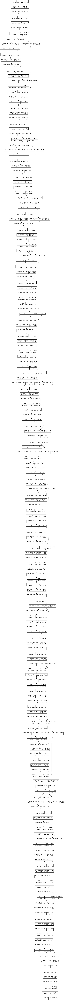

In [ ]:
# Create the model
model = tf.keras.models.Model(inputs = pre_trained_model.input , outputs = x)
tf.keras.utils.plot_model(model, 'model.png', show_shapes=True)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                                                                                              

In [ ]:
model.compile(loss=tf.keras.losses.categorical_crossentropy,
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics = ['accuracy'])

In [ ]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1.0/255.0)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1.0/255.0)

In [ ]:
train_dir = '/content/data/train'
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224,224),
        batch_size=64,
        class_mode='categorical',
        shuffle = True ,
        color_mode="rgb")

y_train = train_generator.classes

test_dir = '/content/data/test'
validation_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224,224),
        batch_size=64,
        class_mode='categorical',
        shuffle = True ,
        color_mode="rgb")

In [ ]:
from collections import Counter
counter = Counter(train_generator.classes)
max_val = float(max(counter.values()))
class_weights = {class_id : max_val/num_images for class_id, num_images in counter.items()}
class_weights

{0: 24.31958762886598,
 1: 25.641304347826086,
 2: 1.0,
 3: 1.854559748427673,
 4: 14.930379746835444,
 5: 28.083333333333332,
 6: 20.336206896551722,
 7: 14.74375,
 8: 16.73049645390071,
 9: 18.286821705426355,
 10: 7.759868421052632,
 11: 6.857558139534884,
 12: 13.876470588235295,
 13: 16.047619047619047,
 14: 24.071428571428573,
 15: 18.5748031496063,
 16: 21.84259259259259,
 17: 20.876106194690266,
 18: 18.72222222222222,
 19: 36.859375,
 20: 23.127450980392158,
 21: 22.466666666666665,
 22: 7.236196319018405,
 23: 30.636363636363637,
 24: 3.6859375}

In [ ]:
batch_size = 64
steps_per_epoch = n_len_training // batch_size
validation_batch_size = 64
validation_steps = n_len_testing // validation_batch_size

In [ ]:
print('Results for CNN Classifier:-\n')
start_time = time.time()

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint('best_model_checkpoint.h5',
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='max',
                             verbose=10)

early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_balanced_accuracy',
min_delta=0, patience=10,mode='max', baseline=None, restore_best_weights=True)

result = model.fit(train_generator,
                   validation_data=validation_generator,
                   batch_size=batch_size,
                   steps_per_epoch=steps_per_epoch,
                   validation_batch_size=validation_batch_size,
                   validation_steps=validation_steps,
                   class_weight=class_weights,
                   epochs=10,
                   shuffle=True,
                   callbacks=[model_checkpoint_callback,early_stopping_callback])

model_time = (time.time() - start_time)
print('\nTraining time(sec) = ', model_time)

Results for CNN Classifier:-

Epoch 1/10
116/116 [==============================] - ETA: 0s - loss: 20.5134 - accuracy: 0.5475
Epoch 1: val_accuracy improved from -inf to 0.02586, saving model to best_model_checkpoint.h5
116/116 [==============================] - 96s 705ms/step - loss: 20.5134 - accuracy: 0.5475 - val_loss: 15.7012 - val_accuracy: 0.0259
Epoch 2/10
116/116 [==============================] - ETA: 0s - loss: 10.8965 - accuracy: 0.7831
Epoch 2: val_accuracy improved from 0.02586 to 0.24192, saving model to best_model_checkpoint.h5
116/116 [==============================] - 82s 703ms/step - loss: 10.8965 - accuracy: 0.7831 - val_loss: 11.2775 - val_accuracy: 0.2419
Epoch 3/10
116/116 [==============================] - ETA: 0s - loss: 6.7305 - accuracy: 0.8610
Epoch 3: val_accuracy did not improve from 0.24192
116/116 [==============================] - 80s 685ms/step - loss: 6.7305 - accuracy: 0.8610 - val_loss: 9.4482 - val_accuracy: 0.0598
Epoch 4/10
116/116 [============

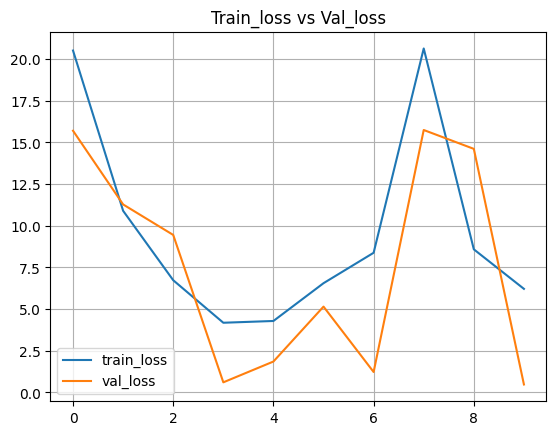

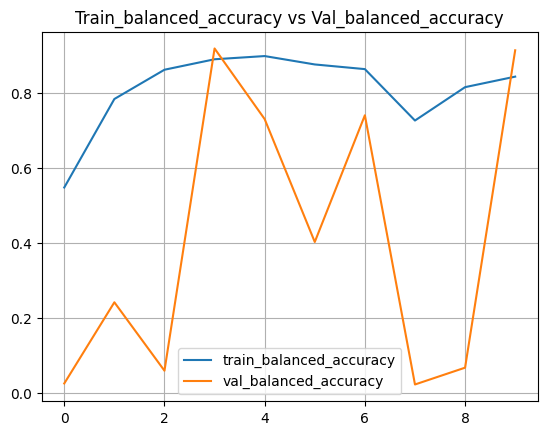

In [ ]:
plt.plot(result.history['loss'] , label = 'train_loss')
plt.plot(result.history['val_loss'] , label = 'val_loss')
plt.title('Train_loss vs Val_loss')
plt.legend()
plt.grid()
plt.show()

plt.plot(result.history['accuracy'] , label = 'train_balanced_accuracy')
plt.plot(result.history['val_accuracy'] , label = 'val_balanced_accuracy')
plt.title('Train_balanced_accuracy vs Val_balanced_accuracy')
plt.legend()
plt.grid()
plt.show()

In [ ]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1.0/255.0)


train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),
        batch_size=64,
        class_mode='categorical',
        shuffle = False ,
        color_mode="rgb")

batch_size = 64
y_train = train_generator.classes

test_datagen  = tf.keras.preprocessing.image.ImageDataGenerator( rescale = 1.0/255.0)

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=64,
        class_mode='categorical',
        shuffle = False ,
        color_mode="rgb")

test_batch_size = 64
y_test = test_generator.classes

Found 7459 images belonging to 25 classes.
Found 1880 images belonging to 25 classes.


In [ ]:
start_time = time.time()
y_pred1 = model.predict(train_generator,batch_size = batch_size)
y_pred1 = np.argmax(y_pred1, axis=1)
print('\nTotal time(sec) = ',(time.time() - start_time))

117/117 [==============================] - 28s 240ms/step

Total time(sec) =  28.48623013496399


In [ ]:
label_map = (train_generator.class_indices)
labels = list(label_map.keys())
labels

['Adialer.C',
 'Agent.FYI',
 'Allaple.A',
 'Allaple.L',
 'Alueron.gen!J',
 'Autorun.K',
 'C2LOP.P',
 'C2LOP.gen!g',
 'Dialplatform.B',
 'Dontovo.A',
 'Fakerean',
 'Instantaccess',
 'Lolyda.AA1',
 'Lolyda.AA2',
 'Lolyda.AA3',
 'Lolyda.AT',
 'Malex.gen!J',
 'Obfuscator.AD',
 'Rbot!gen',
 'Skintrim.N',
 'Swizzor.gen!E',
 'Swizzor.gen!I',
 'VB.AT',
 'Wintrim.BX',
 'Yuner.A']

In [ ]:
label_map

{'Adialer.C': 0,
 'Agent.FYI': 1,
 'Allaple.A': 2,
 'Allaple.L': 3,
 'Alueron.gen!J': 4,
 'Autorun.K': 5,
 'C2LOP.P': 6,
 'C2LOP.gen!g': 7,
 'Dialplatform.B': 8,
 'Dontovo.A': 9,
 'Fakerean': 10,
 'Instantaccess': 11,
 'Lolyda.AA1': 12,
 'Lolyda.AA2': 13,
 'Lolyda.AA3': 14,
 'Lolyda.AT': 15,
 'Malex.gen!J': 16,
 'Obfuscator.AD': 17,
 'Rbot!gen': 18,
 'Skintrim.N': 19,
 'Swizzor.gen!E': 20,
 'Swizzor.gen!I': 21,
 'VB.AT': 22,
 'Wintrim.BX': 23,
 'Yuner.A': 24}

30/30 [==============================] - 8s 253ms/step
Prediction time(sec) =  7.83273720741272


Training score =  0.8461258421413271
Tesing score =  0.8402192186364834


No of missclassified for class Adialer.C (test data) = 0 
No of missclassified for class Agent.FYI (test data) = 0 
No of missclassified for class Allaple.A (test data) = 27 
No of missclassified for class Allaple.L (test data) = 10 
No of missclassified for class Alueron.gen!J (test data) = 1 
No of missclassified for class Autorun.K (test data) = 22 
No of missclassified for class C2LOP.P (test data) = 3 
No of missclassified for class C2LOP.gen!g (test data) = 21 
No of missclassified for class Dialplatform.B (test data) = 0 
No of missclassified for class Dontovo.A (test data) = 0 
No of missclassified for class Fakerean (test data) = 19 
No of missclassified for class Instantaccess (test data) = 1 
No of missclassified for class Lolyda.AA1 (test data) = 4 
No of missclassified for class Lolyda.AA2 (test data) = 

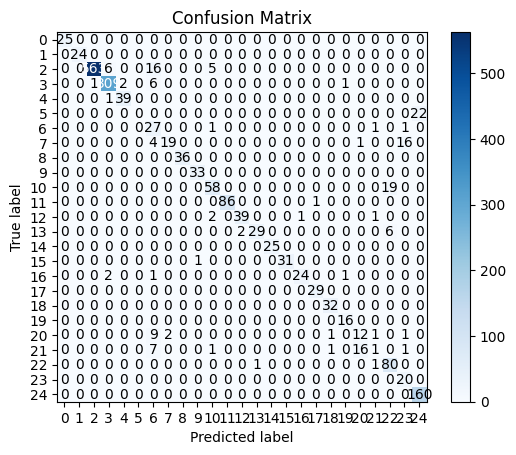



Classification report:-

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        25
           1       1.00      1.00      1.00        24
           2       1.00      0.95      0.98       590
           3       0.97      0.97      0.97       319
           4       0.95      0.97      0.96        40
           5       0.00      0.00      0.00        22
           6       0.39      0.90      0.54        30
           7       0.90      0.47      0.62        40
           8       1.00      1.00      1.00        36
           9       0.97      1.00      0.99        33
          10       0.87      0.75      0.81        77
          11       1.00      0.99      0.99        87
          12       0.95      0.91      0.93        43
          13       0.97      0.78      0.87        37
          14       1.00      1.00      1.00        25
          15       1.00      0.97      0.98        32
          16       0.96      0.86      0.91        28


In [ ]:
import scikitplot as skplt
from sklearn.metrics import classification_report,balanced_accuracy_score,confusion_matrix

start_time = time.time()
y_pred = model.predict(test_generator,batch_size = test_batch_size)
y_pred = np.argmax(y_pred, axis=1)
model_time2 = (time.time() - start_time)
print('Prediction time(sec) = ',model_time2)

cm_model = confusion_matrix(y_test, y_pred)
model_miss = np.sum(y_pred!=y_test.ravel())
acc1_model = balanced_accuracy_score(y_train,y_pred1)
acc2_model = balanced_accuracy_score(y_test,y_pred)

print('\n\nTraining score = ',acc1_model)
print('Tesing score = ',acc2_model)
print('\n')

for i in range(len(labels)):
    err = np.sum(cm_model[i])-cm_model[i][i]
    print('No of missclassified for class {} (test data) = {} '.format(labels[i],err))
print('Total no of missclassified points(test data) = ',model_miss)
print('Total % of missclassified points(test data) = ',model_miss/len(y_test))

print('\n')
print((test_generator.class_indices))
print('\n\nConfusion matrix:')
skplt.metrics.plot_confusion_matrix(y_test, y_pred)
plt.show()
print('\n\nClassification report:-\n')
print(classification_report(y_test,y_pred))
print('**************************************************************************')

CNN = [acc1_model,acc2_model,model_miss,model_miss/len(y_test),model_time,model_time2]